# Perform Principal component analysis and perform clustering using first
3 principal component scores (both heirarchial and k mean clustering(scree plot or elbow curve) and obtain
optimum number of clusters and check whether we have obtained same number of clusters with the original data
(class column we have ignored at the begining who shows it has 3 clusters)df

## Attaching Resources

### Importing Necessary Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering, KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

### Adding Dataset

In [ ]:
wn = pd.read_csv('https://raw.githubusercontent.com/kunal-mallick/Data-Science-Assignments/main/Assignment_08_PCA/Dataset/wine.csv')

wn

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [ ]:
wn_nrow = wn.shape[0]

In [ ]:
def lost_record():

    wn_nrow_now = wn.shape[0]
    lost = wn_nrow - wn_nrow_now
    lost = (lost/wn_nrow)*100
    lost = round(lost, 2)

    return print('We lost ' + str(lost) + ' % data')


## Performing EDA In Dataset

### Applying Descriptive Statistics

In [ ]:
wn.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [ ]:
wn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [ ]:
wn.isna().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [ ]:
def uni(df):

    for i in range(len(df.columns)):
        print('\n All Unique Value in ' + str(df.columns[i]))
        print(np.sort(df[df.columns[i]].unique()))
        print('Total no of unique values ' +
                str(len(df[df.columns[i]].unique())))


In [ ]:
uni(wn)


 All Unique Value in Type
[1 2 3]
Total no of unique values 3

 All Unique Value in Alcohol
[11.03 11.41 11.45 11.46 11.56 11.61 11.62 11.64 11.65 11.66 11.76 11.79
 11.81 11.82 11.84 11.87 11.96 12.   12.04 12.07 12.08 12.16 12.17 12.2
 12.21 12.22 12.25 12.29 12.33 12.34 12.36 12.37 12.42 12.43 12.45 12.47
 12.51 12.52 12.53 12.58 12.6  12.64 12.67 12.69 12.7  12.72 12.77 12.79
 12.81 12.82 12.84 12.85 12.86 12.87 12.88 12.93 12.96 12.99 13.03 13.05
 13.07 13.08 13.11 13.16 13.17 13.2  13.23 13.24 13.27 13.28 13.29 13.3
 13.32 13.34 13.36 13.39 13.4  13.41 13.45 13.48 13.49 13.5  13.51 13.52
 13.56 13.58 13.62 13.63 13.64 13.67 13.68 13.69 13.71 13.72 13.73 13.74
 13.75 13.76 13.77 13.78 13.82 13.83 13.84 13.86 13.87 13.88 13.9  13.94
 14.02 14.06 14.1  14.12 14.13 14.16 14.19 14.2  14.21 14.22 14.23 14.3
 14.34 14.37 14.38 14.39 14.75 14.83]
Total no of unique values 126

 All Unique Value in Malic
[0.74 0.89 0.9  0.92 0.94 0.98 0.99 1.01 1.07 1.09 1.1  1.13 1.17 1.19
 1.21 1.24 1.

### Checking for Duplicated Values

In [ ]:
wn[wn.duplicated()]

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline


- There is no duplicate vale in are dataset

### Visualizing The Data

#### Ploting Boxplot

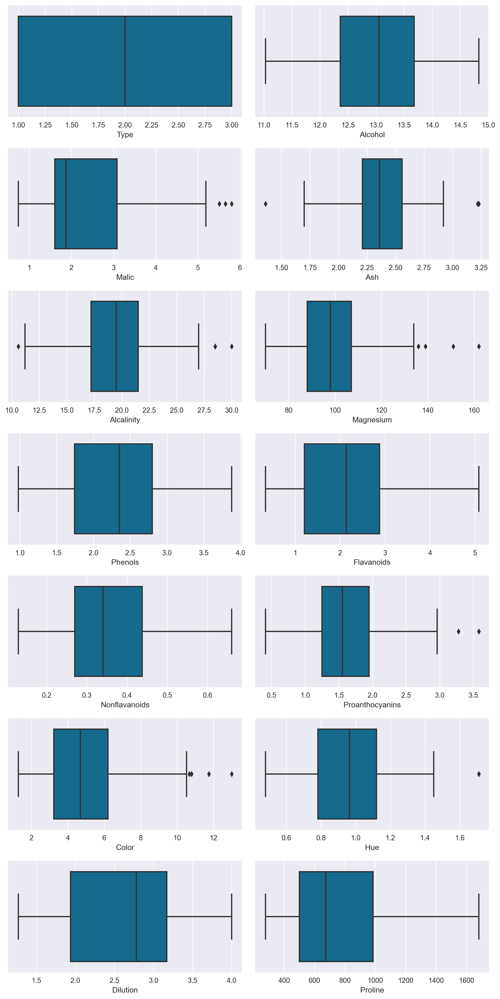

In [ ]:
fig, ax = plt.subplots(7, 2, figsize=(10, 20))

sns.boxplot(wn['Type'], ax = ax[0,0])
sns.boxplot(wn['Alcohol'], ax = ax[0,1])
sns.boxplot(wn['Malic'], ax = ax[1,0])
sns.boxplot(wn['Ash'], ax = ax[1,1])
sns.boxplot(wn['Alcalinity'], ax = ax[2,0])
sns.boxplot(wn['Magnesium'], ax = ax[2,1])
sns.boxplot(wn['Phenols'], ax = ax[3,0])
sns.boxplot(wn['Flavanoids'], ax = ax[3,1])
sns.boxplot(wn['Nonflavanoids'], ax = ax[4,0])
sns.boxplot(wn['Proanthocyanins'], ax = ax[4,1])
sns.boxplot(wn['Color'], ax = ax[5,0])
sns.boxplot(wn['Hue'], ax = ax[5,1])
sns.boxplot(wn['Dilution'], ax = ax[6,0])
sns.boxplot(wn['Proline'], ax = ax[6,1])

plt.tight_layout()

#### Ploting Histplot

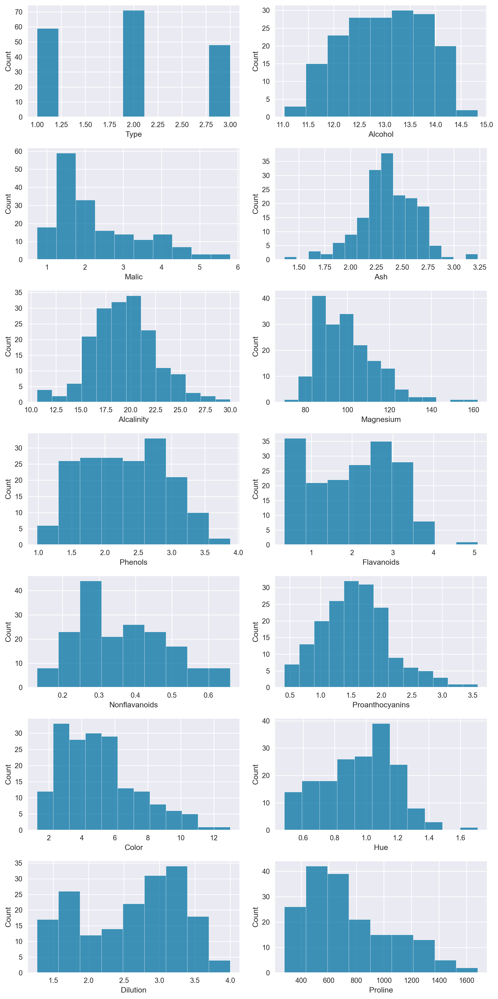

In [ ]:
fig, ax = plt.subplots(7, 2, figsize=(10, 20))

sns.histplot(wn['Type'], ax = ax[0,0])
sns.histplot(wn['Alcohol'], ax = ax[0,1])
sns.histplot(wn['Malic'], ax = ax[1,0])
sns.histplot(wn['Ash'], ax = ax[1,1])
sns.histplot(wn['Alcalinity'], ax = ax[2,0])
sns.histplot(wn['Magnesium'], ax = ax[2,1])
sns.histplot(wn['Phenols'], ax = ax[3,0])
sns.histplot(wn['Flavanoids'], ax = ax[3,1])
sns.histplot(wn['Nonflavanoids'], ax = ax[4,0])
sns.histplot(wn['Proanthocyanins'], ax = ax[4,1])
sns.histplot(wn['Color'], ax = ax[5,0])
sns.histplot(wn['Hue'], ax = ax[5,1])
sns.histplot(wn['Dilution'], ax = ax[6,0])
sns.histplot(wn['Proline'], ax = ax[6,1])

plt.tight_layout()

#### Ploting QQ - Plot

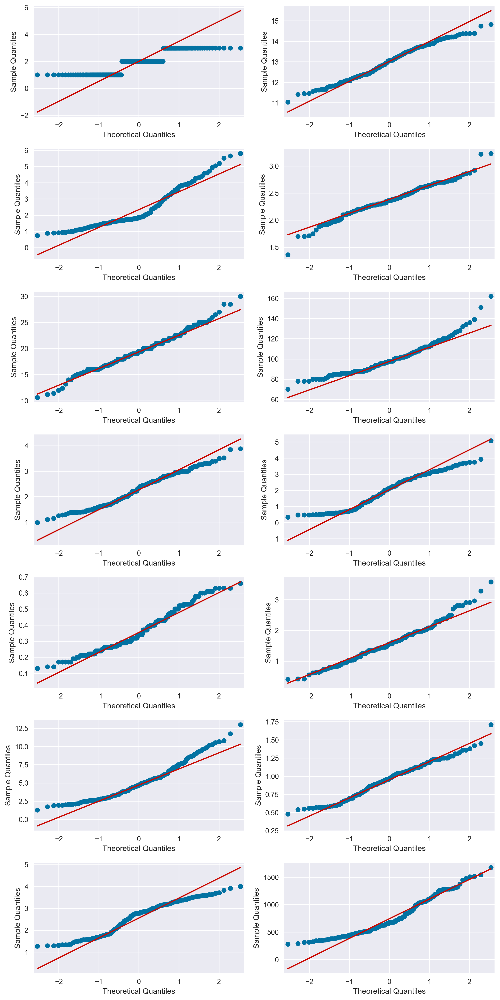

In [ ]:
fig, ax = plt.subplots(7, 2, figsize=(10, 20))

sm.qqplot(wn['Type'], ax = ax[0,0], line = 'q')
sm.qqplot(wn['Alcohol'], ax = ax[0,1], line = 'q')
sm.qqplot(wn['Malic'], ax = ax[1,0], line = 'q')
sm.qqplot(wn['Ash'], ax = ax[1,1], line = 'q')
sm.qqplot(wn['Alcalinity'], ax = ax[2,0], line = 'q')
sm.qqplot(wn['Magnesium'], ax = ax[2,1], line = 'q')
sm.qqplot(wn['Phenols'], ax = ax[3,0], line = 'q')
sm.qqplot(wn['Flavanoids'], ax = ax[3,1], line = 'q')
sm.qqplot(wn['Nonflavanoids'], ax = ax[4,0], line = 'q')
sm.qqplot(wn['Proanthocyanins'], ax = ax[4,1], line = 'q')
sm.qqplot(wn['Color'], ax = ax[5,0], line = 'q')
sm.qqplot(wn['Hue'], ax = ax[5,1], line = 'q')
sm.qqplot(wn['Dilution'], ax = ax[6,0], line = 'q')
sm.qqplot(wn['Proline'], ax = ax[6,1], line = 'q')

plt.tight_layout()

### Correlation Analysis

In [ ]:
sns.pairplot(data = wn)

<AxesSubplot:>

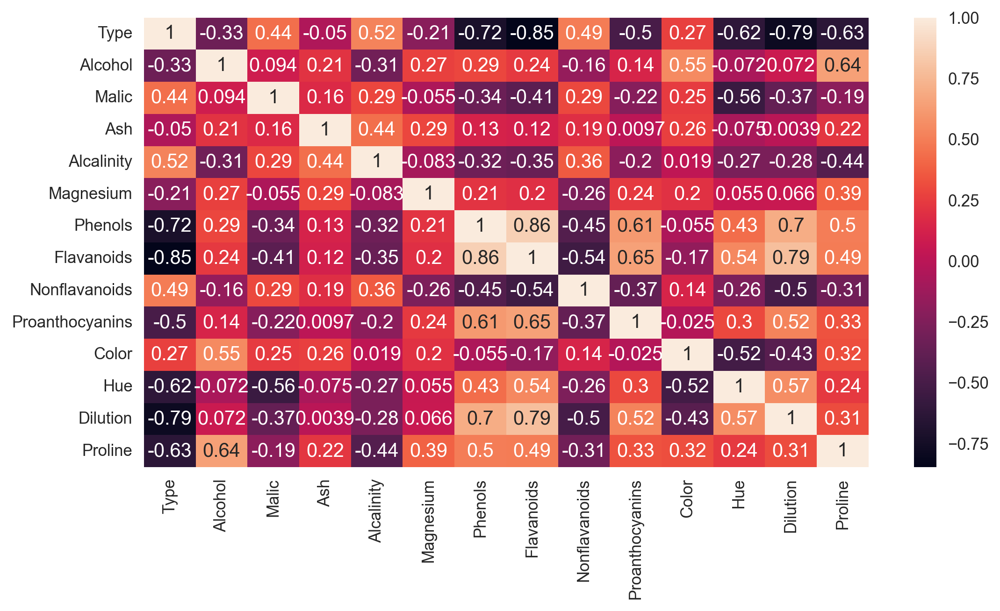

In [ ]:
sns.heatmap(wn.corr(), annot=True)

### Outlier Detection

In [ ]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')


In [ ]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)


In [ ]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st


#### Outlier Percentage (Before)

In [ ]:
outlier_percentage(wn)

Type : 0.0 %
Alcohol : 0.0 %
Malic : 1.6853932584269662 %
Ash : 1.6853932584269662 %
Alcalinity : 2.247191011235955 %
Magnesium : 2.247191011235955 %
Phenols : 0.0 %
Flavanoids : 0.0 %
Nonflavanoids : 0.0 %
Proanthocyanins : 1.1235955056179776 %
Color : 2.247191011235955 %
Hue : 0.5617977528089888 %
Dilution : 0.0 %
Proline : 0.0 %


#### Removing Outlier In Malic Column

In [ ]:
pe.box(wn['Malic'], orientation='h')


In [ ]:
wn = remove_outlier(wn, 'Malic')

In [ ]:
pe.box(wn['Malic'], orientation='h')


In [ ]:
lost_record()

We lost 1.69 % data


#### Removing Outlier In Ash Column

In [ ]:
pe.box(wn['Ash'], orientation='h')


In [ ]:
wn = remove_outlier(wn, 'Ash')

In [ ]:
pe.box(wn['Ash'], orientation='h')


In [ ]:
lost_record()

We lost 3.37 % data


#### Removing Outlier In Alcalinity Column

In [ ]:
pe.box(wn['Alcalinity'], orientation='h')


In [ ]:
wn = remove_outlier(wn, 'Alcalinity')

In [ ]:
pe.box(wn['Alcalinity'], orientation='h')

In [ ]:
lost_record()

We lost 4.49 % data


#### Removing Outlier In Magnesium Column

In [ ]:
pe.box(wn['Magnesium'], orientation='h')


In [ ]:
wn = remove_outlier(wn, 'Magnesium')

In [ ]:
pe.box(wn['Magnesium'], orientation='h')

In [ ]:
lost_record()

We lost 6.18 % data


#### Removing Outlier In Proanthocyanins Column

In [ ]:
pe.box(wn['Proanthocyanins'], orientation='h')


In [ ]:
wn = remove_outlier(wn, 'Proanthocyanins')

In [ ]:
pe.box(wn['Proanthocyanins'], orientation='h')

In [ ]:
lost_record()

We lost 7.3 % data


#### Removing Outlier In Color Column

In [ ]:
pe.box(wn['Color'], orientation='h')


In [ ]:
wn = remove_outlier(wn, 'Color')

In [ ]:
pe.box(wn['Color'], orientation='h')

In [ ]:
lost_record()

We lost 8.99 % data


#### Outlier Percentage (After)

In [ ]:
outlier_percentage(wn)

Type : 0.0 %
Alcohol : 0.0 %
Malic : 0.0 %
Ash : 1.8518518518518516 %
Alcalinity : 1.8518518518518516 %
Magnesium : 0.6172839506172839 %
Phenols : 0.0 %
Flavanoids : 0.0 %
Nonflavanoids : 0.0 %
Proanthocyanins : 1.2345679012345678 %
Color : 0.6172839506172839 %
Hue : 0.6172839506172839 %
Dilution : 0.0 %
Proline : 0.0 %


- we will be retaining all the left outlier

### Resetting Index

In [ ]:
wn.reset_index(inplace = True)

wn

,index,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,172,3,14.16,2.51,2.48,20.0,91,1.68,0.70,0.44,1.24,9.70,0.62,1.71,660
158,174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
159,175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
160,176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


### Spliting Data Into X And Y

In [ ]:
x = wn.drop(columns = ['Type'])

x.head()

,index,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [ ]:
y = wn['Type']

y

0      1
1      1
2      1
3      1
4      1
      ..
157    3
158    3
159    3
160    3
161    3
Name: Type, Length: 162, dtype: int64

## Performing Feature Scaling

In [ ]:
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)

scaled_x

,index,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,-1.685255,1.505883,-0.575146,0.275608,-1.254479,2.303381,0.829229,1.058247,-0.657240,1.461621,0.290105,0.350185,1.830889,0.988349
1,-1.665866,0.221657,-0.508402,-0.928862,-2.740590,0.120758,0.589316,0.750683,-0.821550,-0.511079,-0.294343,0.394840,1.097733,0.941033
2,-1.646478,0.171784,0.044613,1.272411,-0.241222,0.201596,0.829229,1.242785,-0.492930,2.477268,0.308659,0.305530,0.773452,1.366881
3,-1.627089,1.680437,-0.346312,0.566342,-0.849176,1.171650,2.508618,1.499088,-0.985860,1.246772,1.292016,-0.453609,1.168228,2.297438
4,-1.607700,0.271530,0.263912,2.103080,0.569384,1.575840,0.829229,0.678918,0.246465,0.543632,-0.322174,0.350185,0.435072,-0.052613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,1.649589,1.418605,0.187634,0.483275,0.231631,-0.606783,-0.962119,-1.361254,0.657240,-0.589206,2.173326,-1.525334,-1.285025,-0.289195
158,1.688367,0.471021,1.522500,0.483275,1.244889,0.282434,-0.770189,-1.309993,0.575085,-0.257167,1.060092,-1.168092,-1.496512,-0.005296
159,1.707755,0.308935,1.875285,-0.430461,0.231631,1.737515,-1.106067,-1.371506,0.575085,-0.374357,2.405250,-1.659300,-1.496512,0.262830
160,1.727144,0.184252,0.263912,0.026407,0.231631,1.737515,-1.010102,-1.381758,1.396634,-0.159509,1.987787,-1.614645,-1.411917,0.278602


## Performing Dimension Reductionality

### Creating PCA With Default Value

In [ ]:
pca_def = PCA()
pcs_def = pca_def.fit_transform(scaled_x)
pcs_def

array([[-3.87860069, -1.62653458,  0.05003072, ...,  0.64309404,
        -0.09531146,  0.19906827],
       [-2.81802593,  0.25775015, -2.01645181, ...,  0.32231575,
        -0.24627916,  0.06925315],
       [-3.07103511, -0.93405823,  1.15257593, ..., -0.13526271,
        -0.57475793,  0.3333375 ],
       ...,
       [ 3.10961799, -3.19050564, -0.97941817, ...,  0.52377482,
         0.09272409, -0.05723467],
       [ 2.82341868, -2.64163234, -0.55196679, ...,  0.40579508,
         0.4153933 , -0.0826756 ],
       [ 3.66306508, -2.85603169,  1.05189487, ...,  0.0177474 ,
         0.19493007,  0.18568478]])

In [ ]:
pca_def.explained_variance_ratio_

array([0.4111682 , 0.19548833, 0.08849578, 0.06788704, 0.05339032,
       0.04208611, 0.0335331 , 0.02477941, 0.02218136, 0.01919693,
       0.01675316, 0.01253181, 0.00798692, 0.00452152])

In [ ]:
np.cumsum(pca_def.explained_variance_ratio_)

array([0.4111682 , 0.60665653, 0.69515231, 0.76303935, 0.81642967,
       0.85851578, 0.89204888, 0.91682829, 0.93900966, 0.95820659,
       0.97495974, 0.98749156, 0.99547848, 1.        ])

- As it is clear that 90% of the data came from the first column alone, we will use n component 8.

### Creating PCA With 3 Component

In [ ]:
pca_8 = PCA(n_components = 8)
pcs_8 = pca_8.fit_transform(scaled_x)
pcs_8

array([[-3.87860069, -1.62653458,  0.05003072, ...,  0.40013922,
        -0.83364564, -0.35243026],
       [-2.81802593,  0.25775015, -2.01645181, ...,  1.22342263,
        -0.17260515,  0.8234299 ],
       [-3.07103511, -0.93405823,  1.15257593, ..., -0.36974298,
        -0.29939929, -0.3970008 ],
       ...,
       [ 3.10961799, -3.19050564, -0.97941817, ..., -0.26008591,
        -1.09453953, -0.57404126],
       [ 2.82341868, -2.64163234, -0.55196679, ..., -1.22087358,
        -1.33460566, -0.03941061],
       [ 3.66306508, -2.85603169,  1.05189487, ..., -0.45664254,
         0.32722777,  0.06122343]])

#### Creating DataFrame

In [ ]:
wn_scaled_pca = pd.DataFrame(pcs_8, columns=['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8'])
wn_scaled_pca['cluster'] = y

wn_scaled_pca

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,cluster
0,-3.878601,-1.626535,0.050031,-0.134905,0.559728,0.400139,-0.833646,-0.352430,1
1,-2.818026,0.257750,-2.016452,-0.839115,0.438894,1.223423,-0.172605,0.823430,1
2,-3.071035,-0.934058,1.152576,0.854951,-0.886892,-0.369743,-0.299399,-0.397001,1
3,-4.247606,-2.722652,-0.105287,0.638571,-0.273224,-0.346418,0.148900,0.901380,1
4,-1.560892,-1.068026,2.449365,-0.457674,0.091209,0.554271,-0.655037,0.030043,1
...,...,...,...,...,...,...,...,...,...
157,2.852196,-2.248017,-0.944316,0.215034,-0.650576,-1.082238,0.796145,0.216203,3
158,3.093785,-1.933361,0.342655,0.708847,-0.162718,-0.225099,0.063901,-0.507313,3
159,3.109618,-3.190506,-0.979418,0.675493,0.643505,-0.260086,-1.094540,-0.574041,3
160,2.823419,-2.641632,-0.551967,-0.292420,0.289731,-1.220874,-1.334606,-0.039411,3


## Preparing Model From The Dataset

### Creating Model With Hierarchical Clustering

#### Ploting Dendrogram

##### Ploting Dendrogram With All Method

In [ ]:
def plot_all_dendrogram(scaled_x):
    for methods in ['single','complete','average','weighted','centroid','median','ward']:
        plt.figure(figsize =(14,6))
        dict = {'fontsize':16,'fontweight' :14, 'color' : 'Black'}
        plt.title('Plotting Dendrogram with Method {}'.format(methods),fontdict = dict)
        Dendrogram1 = hierarchy.dendrogram(hierarchy.linkage(scaled_x, method = methods,optimal_ordering=False))

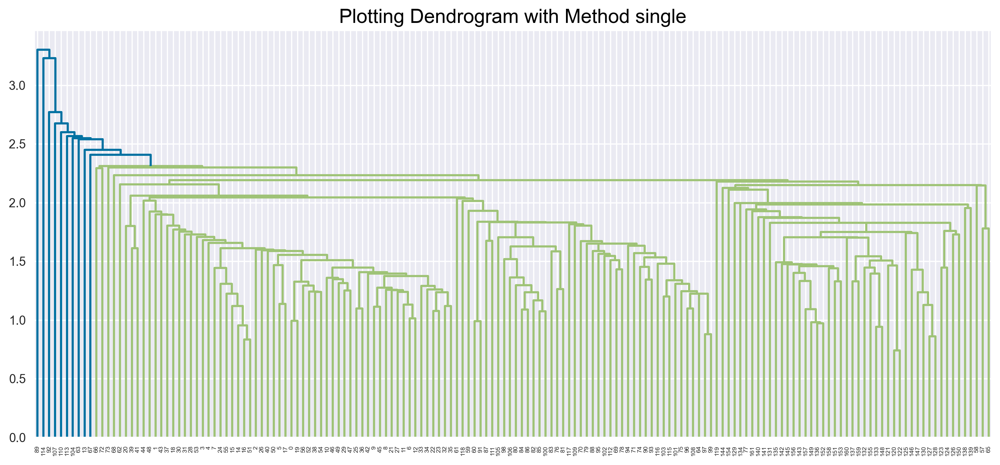

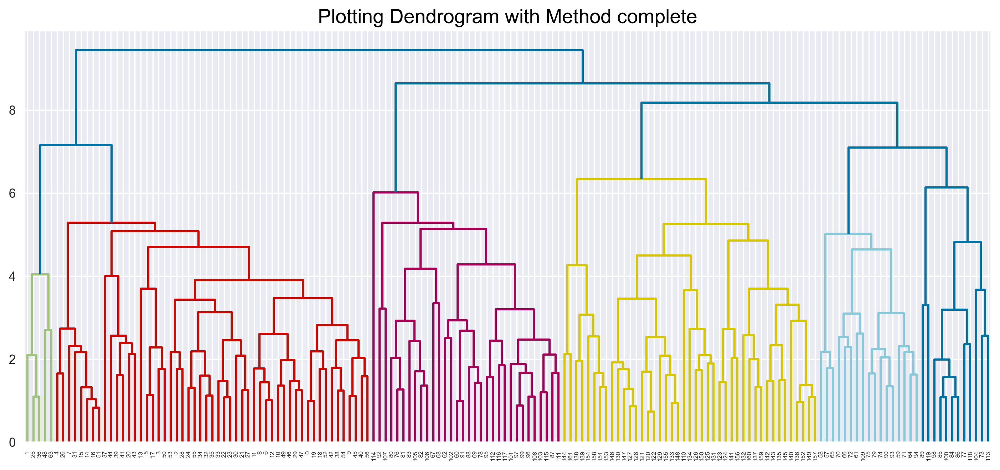

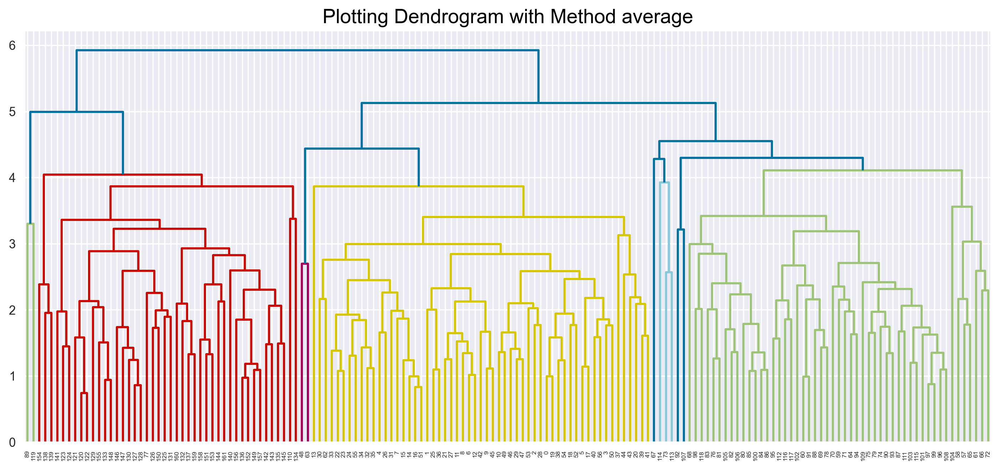

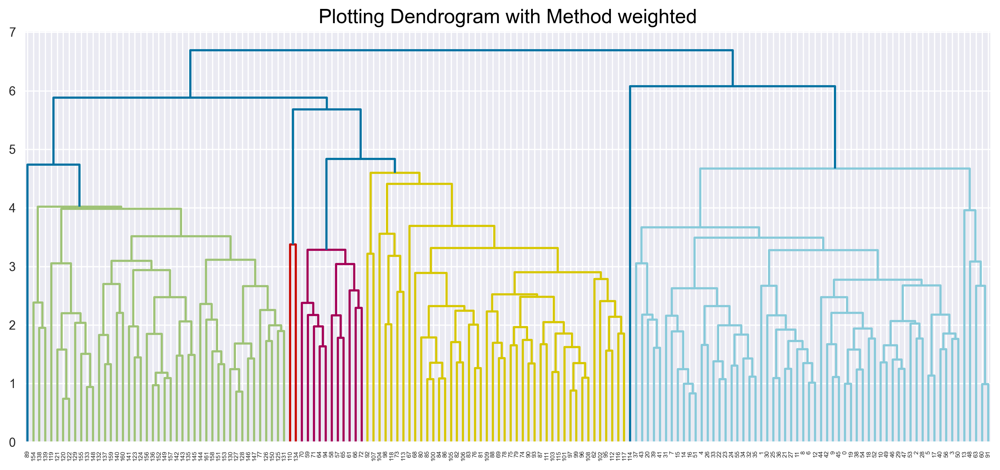

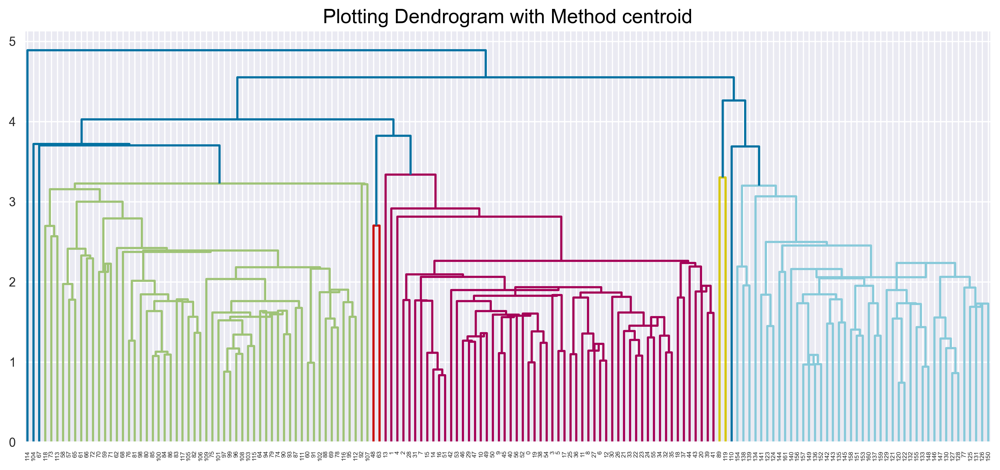

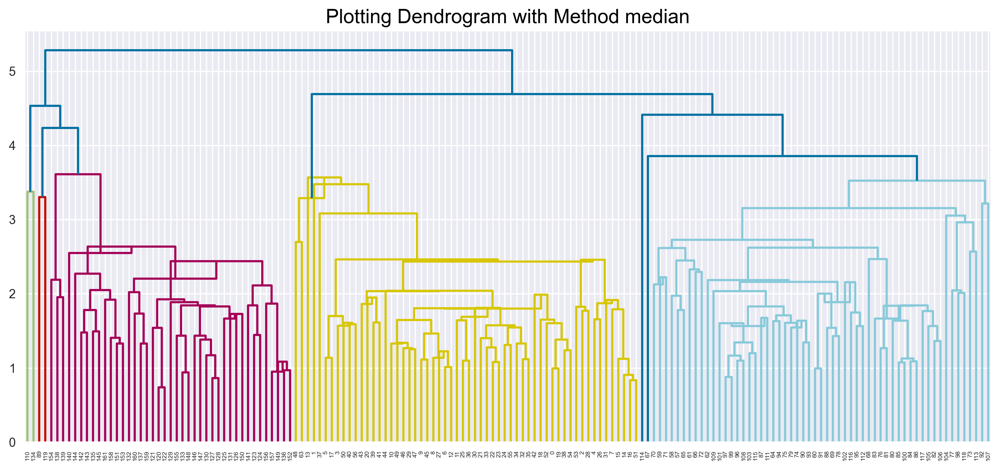

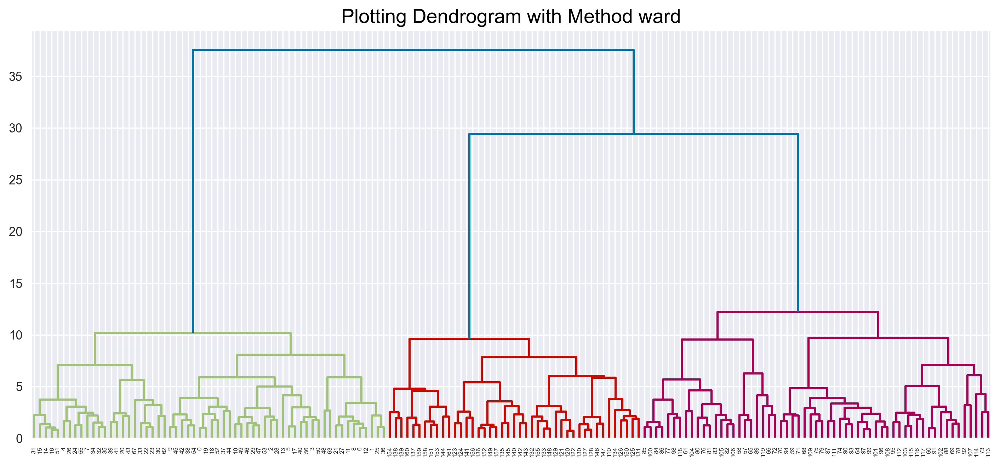

In [ ]:
plot_all_dendrogram(wn_scaled_pca.iloc[:,:-1])

##### Picking Best Method For Dendrogram

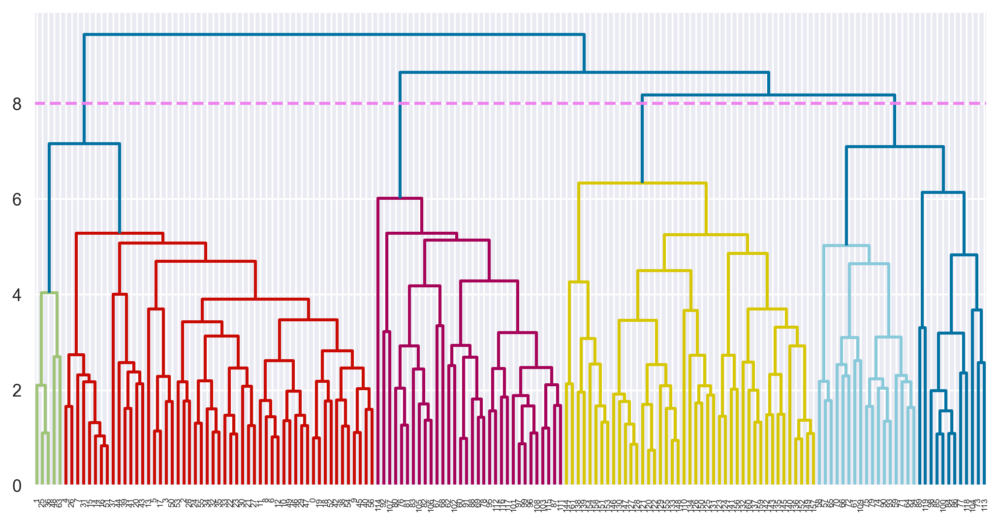

In [ ]:
lk_complete = hierarchy.linkage(wn_scaled_pca.iloc[:,:-1],method='complete')
dendrogram_complete = hierarchy.dendrogram(lk_complete)
plt.axhline(y = 8 , c = 'violet', linestyle = '--')

#### Preparing Hierarchical Clustering Model

In [ ]:
hc = AgglomerativeClustering(n_clusters = 3)

y_hc = hc.fit_predict(wn_scaled_pca.iloc[:,:-1])

y_hc

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2], dtype=int64)

In [ ]:
wn_scaled_pca['Hc_cluster'] = y_hc

wn_scaled_pca

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,cluster,Hc_cluster
0,-3.878601,-1.626535,0.050031,-0.134905,0.559728,0.400139,-0.833646,-0.352430,1,1
1,-2.818026,0.257750,-2.016452,-0.839115,0.438894,1.223423,-0.172605,0.823430,1,1
2,-3.071035,-0.934058,1.152576,0.854951,-0.886892,-0.369743,-0.299399,-0.397001,1,1
3,-4.247606,-2.722652,-0.105287,0.638571,-0.273224,-0.346418,0.148900,0.901380,1,1
4,-1.560892,-1.068026,2.449365,-0.457674,0.091209,0.554271,-0.655037,0.030043,1,1
...,...,...,...,...,...,...,...,...,...,...
157,2.852196,-2.248017,-0.944316,0.215034,-0.650576,-1.082238,0.796145,0.216203,3,2
158,3.093785,-1.933361,0.342655,0.708847,-0.162718,-0.225099,0.063901,-0.507313,3,2
159,3.109618,-3.190506,-0.979418,0.675493,0.643505,-0.260086,-1.094540,-0.574041,3,2
160,2.823419,-2.641632,-0.551967,-0.292420,0.289731,-1.220874,-1.334606,-0.039411,3,2


#### Evaluating Silhouette Score For Hierarchical Clustering Model

In [ ]:
silhouette_score(wn_scaled_pca.iloc[:,:-2],y_hc)

0.3424153766555488

#### Comparing Original and Hierarchical Clustering

<AxesSubplot:title={'center':'Hierarchical Clustering'}, xlabel='pc1', ylabel='pc2'>

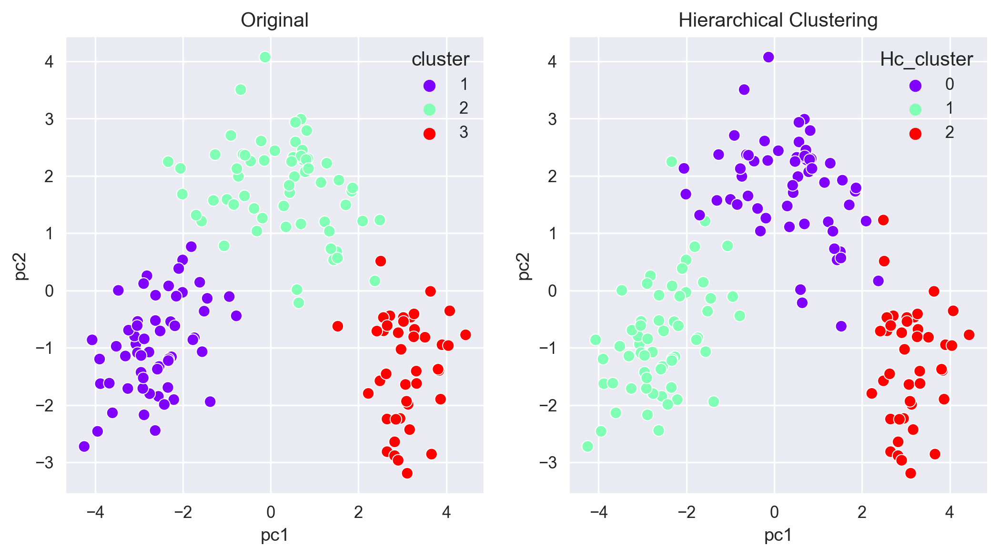

In [ ]:
fig, ax = plt.subplots(ncols = 2)

ax[0].title.set_text('Original')
sns.scatterplot(wn_scaled_pca['pc1'], wn_scaled_pca['pc2'], ax = ax[0], hue = wn_scaled_pca['cluster'], palette = 'rainbow')

ax[1].title.set_text('Hierarchical Clustering')
sns.scatterplot(wn_scaled_pca['pc1'], wn_scaled_pca['pc2'], ax = ax[1], hue = wn_scaled_pca['Hc_cluster'], palette = 'rainbow')

### Creating Model With K-MEANS Clustering

#### Ploting Elbow Graph

In [ ]:
def plot_elbow_graph(x,n):
    wcss = []
    n = int(n)
    for i in range(1,n):
        km = KMeans(n_clusters=i)
        km.fit_predict(x)
        wcss.append(km.inertia_)

    sns.lineplot(range(1,n), wcss)
    plt.xlabel('K-values')
    plt.ylabel('WCSS')
    plt.title(label = 'Elbow Graph')

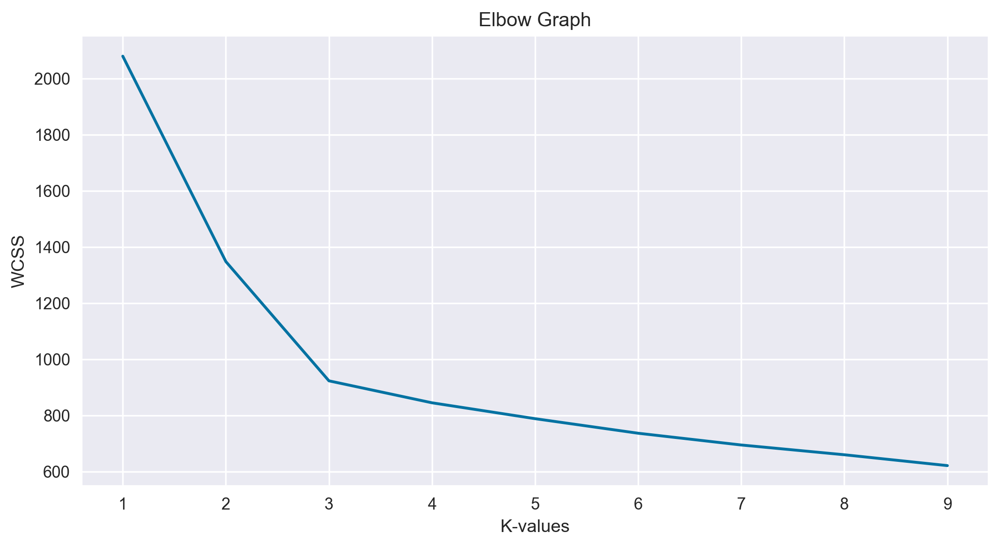

In [ ]:
plot_elbow_graph(wn_scaled_pca.iloc[:,:-2],10)

#### Preparing K-MEANS Clustering Model

In [ ]:
km = KMeans(n_clusters = 3)
y_km = km.fit_predict(wn_scaled_pca.iloc[:,:-2])

y_km

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
wn_scaled_pca['Km_cluster'] = y_km

wn_scaled_pca.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,cluster,Hc_cluster,Km_cluster
0,-3.878601,-1.626535,0.050031,-0.134905,0.559728,0.400139,-0.833646,-0.352430,1,1,0
1,-2.818026,0.257750,-2.016452,-0.839115,0.438894,1.223423,-0.172605,0.823430,1,1,0
2,-3.071035,-0.934058,1.152576,0.854951,-0.886892,-0.369743,-0.299399,-0.397001,1,1,0
3,-4.247606,-2.722652,-0.105287,0.638571,-0.273224,-0.346418,0.148900,0.901380,1,1,0
4,-1.560892,-1.068026,2.449365,-0.457674,0.091209,0.554271,-0.655037,0.030043,1,1,0


#### Evaluating Silhouette Score For K-MEANS Model

In [ ]:
silhouette_score(wn_scaled_pca.iloc[:,:-3],y_km)

0.3514738595670694

##### Ploting Silhouette Plot

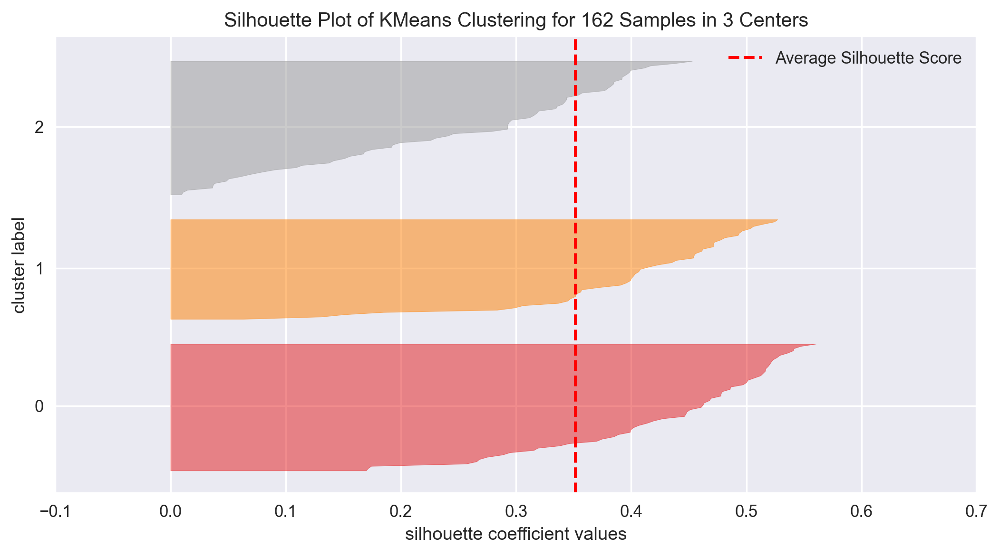

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 162 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
vis = SilhouetteVisualizer(km)

vis.fit(wn_scaled_pca.iloc[:,:-3])
vis.show()

#### Comparing Original, Hierarchical Clustering And K-MEANS Clustering

In [ ]:
km.cluster_centers_

array([[-2.62613797, -0.96493114, -0.04465055, -0.11321379, -0.10326381,
         0.1718056 ,  0.06711103,  0.02423401],
       [ 3.0642125 , -1.23781609, -0.24121392,  0.10861846,  0.00518322,
        -0.07459547,  0.04328672, -0.01035856],
       [ 0.19667169,  1.84504665,  0.22332846,  0.02608925,  0.09421321,
        -0.10726871, -0.09622052, -0.01525339]])

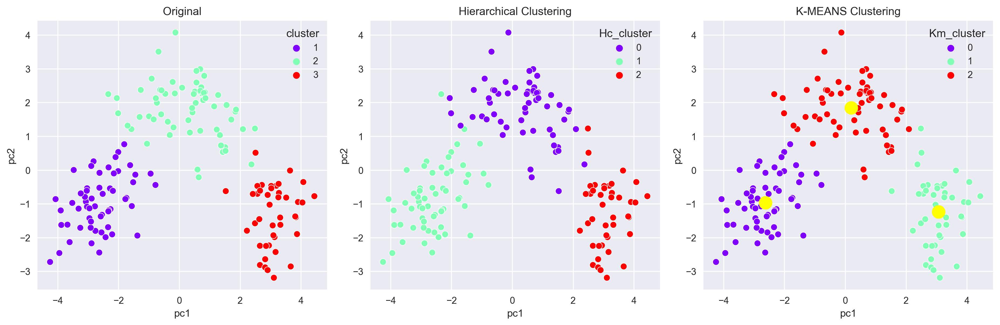

In [ ]:
fig, ax = plt.subplots(ncols = 3, figsize=(15, 5))

ax[0].title.set_text('Original')
sns.scatterplot(wn_scaled_pca['pc1'], wn_scaled_pca['pc2'], ax = ax[0], hue = wn_scaled_pca['cluster'], palette = 'rainbow')

ax[1].title.set_text('Hierarchical Clustering')
sns.scatterplot(wn_scaled_pca['pc1'], wn_scaled_pca['pc2'], ax = ax[1], hue = wn_scaled_pca['Hc_cluster'], palette = 'rainbow')

ax[2].title.set_text('K-MEANS Clustering')
sns.scatterplot(wn_scaled_pca['pc1'], wn_scaled_pca['pc2'], ax = ax[2], hue = wn_scaled_pca['Km_cluster'], palette = 'rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], s = 200, c = 'yellow')

plt.tight_layout()